# Welcome to another notebook for ATOC NWP: Make Animations

In [1]:
import os
import csv
import glob
import numpy as np                  # For doing math
import matplotlib
import matplotlib.pyplot as plt     # For plotting
import matplotlib.dates as mdates   # For formatting dates when plotting
import matplotlib.colors as colors  # For truncating colorbars
import matplotlib.style as style
import matplotlib.units as munits
import xarray as xr                 # For dealing with netCDF data
import cartopy.crs as ccrs          # For plotting maps
import cartopy.feature as cfeature  # For plotting maps
import pandas as pd                 # A quick way to deal with time stamps
import netCDF4 as nc                # Another way to deal with netCDF data

import metpy.calc as mpcalc
import datetime
import scipy.interpolate
import scipy.signal as sig
import scipy.stats as stats
import sys
import scipy.io as sio

import cartopy.crs as ccrs          # For plotting maps
import cartopy.feature as cfeature  # For plotting maps

from netCDF4 import Dataset
from xarray import DataArray
from matplotlib import colors as mcolors
from scipy.optimize import curve_fit
# from netCDF4 import Dataset

from metpy.cbook import get_test_data
from metpy.plots import Hodograph, SkewT
from metpy.units import units
from scipy.signal import savgol_filter
from scipy.stats import binned_statistic
from matplotlib.gridspec import GridSpec
from numpy.random import seed
from numpy.random import rand
from datetime import datetime
from wrf import (getvar, interplevel, vertcross, 
                 vinterp, ALL_TIMES, extract_global_attrs)

print('Done importing modules now')

import warnings
warnings.filterwarnings('ignore')

Done importing modules now


## Define some useful functions

In [2]:
def getheights(ds):
    '''
    From a dataset of wrfout files, calculate height above the surface
    '''

    heights3d_stag = (ds['PH'].isel(Time=1) + ds['PHB'].isel(Time=1))/9.81 - ds['HGT'].isel(Time=1).values
    heights_stag = heights3d_stag.mean(('south_north', 'west_east')).values

    heights_destag = []
    for i in range(len(heights_stag)-1):
        heights_destag.append(0.5*(heights_stag[i]+heights_stag[i+1]))
    heights_destag = np.array(heights_destag)

    return heights_destag

In [3]:
def destagger(var, stagger_dim):
    '''
    From wrf-python https://github.com/NCAR/wrf-python/blob/b40d1d6e2d4aea3dd2dda03aae18e268b1e9291e/src/wrf/destag.py 
    '''
    var_shape = var.shape
    num_dims = var.ndim
    stagger_dim_size = var_shape[stagger_dim]

    full_slice = slice(None)
    slice1 = slice(0, stagger_dim_size - 1, 1)
    slice2 = slice(1, stagger_dim_size, 1)

    dim_ranges_1 = [full_slice] * num_dims
    dim_ranges_2 = [full_slice] * num_dims

    dim_ranges_1[stagger_dim] = slice1
    dim_ranges_2[stagger_dim] = slice2

    result = .5*(var[tuple(dim_ranges_1)] + var[tuple(dim_ranges_2)])

    return result

# Now open up the datafiles that might be needed

In [4]:
# Define directories to read in and open as xarray

# DIR_1 = '/projects/jiko1138/ATOC_3030/Project/Ida/Simulation#4/'
DIR_1 = '/scratch/summit/jiko1138/Ida/Ida_05/'
DIR_2 = DIR_1
DIR_3 = DIR_1
DIR_4 = DIR_1

filenames_3 = sorted([f for f in glob.glob(DIR_3+"/wrfout_d01_*")])
# print(filenames)

ds_3 = xr.open_mfdataset(filenames_3[:], 
                       concat_dim = 'Time',
                      combine = 'nested',
                      parallel=True)

# height_1 = getheights(ds_1)
# u_1 = destagger(ds_1['U'], 3)
# v_1 = destagger(ds_1['V'], 2)


# print('U:',np.shape(u_1))
# print('V:',np.shape(v_1))
# print('Height:',np.shape(height_1))

times_3 = ds_3['XTIME'].values

In [5]:
print(times_3)

['2021-08-25T00:00:00.000000000' '2021-08-25T03:00:00.000000000'
 '2021-08-25T06:00:00.000000000' '2021-08-25T09:00:00.000000000'
 '2021-08-25T12:00:00.000000000' '2021-08-25T15:00:00.000000000'
 '2021-08-25T18:00:00.000000000' '2021-08-25T21:00:00.000000000'
 '2021-08-26T00:00:00.000000000' '2021-08-26T03:00:00.000000000'
 '2021-08-26T06:00:00.000000000' '2021-08-26T09:00:00.000000000'
 '2021-08-26T12:00:00.000000000' '2021-08-26T15:00:00.000000000'
 '2021-08-26T18:00:00.000000000' '2021-08-26T21:00:00.000000000'
 '2021-08-27T00:00:00.000000000' '2021-08-27T03:00:00.000000000'
 '2021-08-27T06:00:00.000000000' '2021-08-27T09:00:00.000000000'
 '2021-08-27T12:00:00.000000000' '2021-08-27T15:00:00.000000000'
 '2021-08-27T18:00:00.000000000' '2021-08-27T21:00:00.000000000'
 '2021-08-28T00:00:00.000000000' '2021-08-28T03:00:00.000000000'
 '2021-08-28T06:00:00.000000000' '2021-08-28T09:00:00.000000000'
 '2021-08-28T12:00:00.000000000' '2021-08-28T15:00:00.000000000'
 '2021-08-28T18:00:00.000

In [6]:
# Make a time series plot of maximum wind speed at 10m altitude anywhere in the domain

## extract U10 and V10, combine to get wind speed.
WS_10m_3 = (ds_3['U10'] **2 + ds_3['V10'] **2) ** 0.5

## get the maximum value in both the x and y direction

max_WS_3 = WS_10m_3.max(axis=2).max(axis=1)

In [7]:
print(np.shape(WS_10m_3))

(65, 302, 395)


## Time series of max wind speed

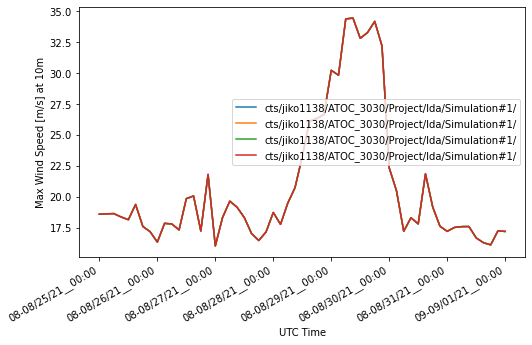

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(8,6))

ax.plot(times_1, max_WS_1, label=DIR1_label)
ax.plot(times_2, max_WS_2, label=DIR2_label)
ax.plot(times_3, max_WS_3, label=DIR3_label)
ax.plot(times_4, max_WS_4, label=DIR4_label)

ax.legend()
ax.set_ylabel("Max Wind Speed [m/s] at 10m")
ax.set_xlabel("UTC Time")

plt.gcf().autofmt_xdate()
myFmt = mdates.DateFormatter('%m-%D__%H:%M')
ax.xaxis.set_major_formatter(myFmt)

plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("Max_ws_timeseries.pdf")

plt.show()


In [39]:
# Make a time series plot of precipitation in entire domain
 
precip_3 = ds_3['RAINC'] + ds_3['RAINNC'] 
total_precip_3 = precip_3.sum(axis=2).sum(axis=1)

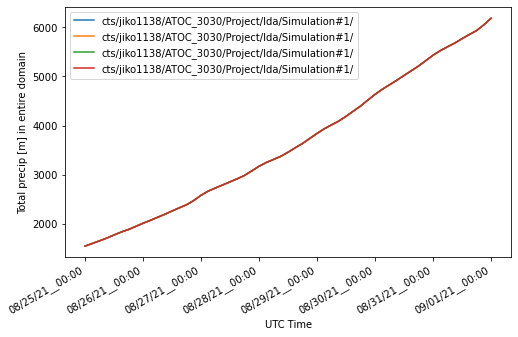

In [9]:
# Make a time series plot of precip at one specific location

fig, ax = plt.subplots(1, 1, figsize=(8,6))

ax.plot(times_1, total_precip_1/1000., label=DIR1_label)
ax.plot(times_2, total_precip_2/1000., label=DIR2_label)
ax.plot(times_3, total_precip_3/1000., label=DIR3_label)
ax.plot(times_4, total_precip_4/1000., label=DIR4_label)

ax.legend()
ax.set_ylabel("Total precip [m] in entire domain")
ax.set_xlabel("UTC Time")

plt.gcf().autofmt_xdate()
myFmt = mdates.DateFormatter('%D__%H:%M')
ax.xaxis.set_major_formatter(myFmt)

plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("Total_precip_timeseries.pdf")

plt.show()

In [10]:
# Make a time series plot of precip at one specific location

precip_1 = ds_1['RAINC'] + ds_1['RAINNC'] 
precip_2 = ds_2['RAINC'] + ds_2['RAINNC'] 
precip_3 = ds_3['RAINC'] + ds_3['RAINNC'] 
precip_4 = ds_4['RAINC'] + ds_4['RAINNC'] 

south_north_index=91
west_east_index=33
this_lat = ds_1['XLAT'].isel(Time=0,south_north=south_north_index,west_east=west_east_index)
this_lon = ds_1['XLONG'].isel(Time=0,south_north=south_north_index,west_east=west_east_index)
id_string = 'Looking at '+str(this_lat.values)+' N, '+str(this_lon.values)+' W'
print(id_string)
# wanted 29.9511° N, 90.0715° W

this_precip_1 = precip_1.isel(south_north=south_north_index,west_east=west_east_index)
this_precip_2 = precip_2.isel(south_north=south_north_index,west_east=west_east_index)
this_precip_3 = precip_3.isel(south_north=south_north_index,west_east=west_east_index)
this_precip_4 = precip_4.isel(south_north=south_north_index,west_east=west_east_index)

Looking at 24.389915 N, -105.77222 W


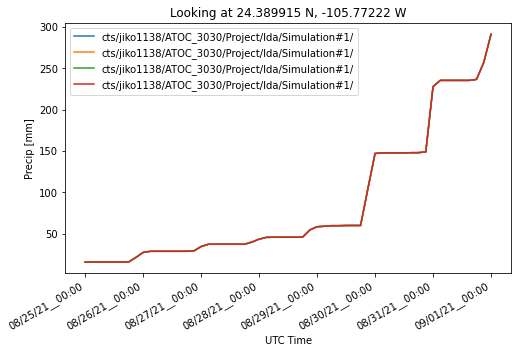

In [11]:
# Make a time series plot of precip at one specific location as identified in the cell above

fig, ax = plt.subplots(1, 1, figsize=(8,6))

ax.plot(times_1, this_precip_1, label=DIR1_label)
ax.plot(times_2, this_precip_2, label=DIR1_label)
ax.plot(times_3, this_precip_3, label=DIR1_label)
ax.plot(times_4, this_precip_4, label=DIR1_label)

ax.legend()
ax.set_ylabel("Precip [mm]")
ax.set_xlabel("UTC Time")
ax.set_title(id_string)

plt.gcf().autofmt_xdate()
myFmt = mdates.DateFormatter('%D__%H:%M')
ax.xaxis.set_major_formatter(myFmt)

plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("OneCell_precip_timeseries.pdf")

plt.show()


In [12]:
test = ds_1['XTIME'].isel(Time=17).values
# demo = pd.to_datetime(datetime.datetime.fromtimestamp(test).strftime('%Y-%m-%dTO%H:%M:%S.000000000'))
# test2 = pd.to_datetime(datetime.datetime.fromtimestamp(test).strftime('%Y-%m-%dTO%H:%M:%S.000000000')) 
test2 = pd.to_datetime(ds_1['XTIME'].isel(Time=40).values) 

print(((test2)))

2021-08-30 00:00:00


0

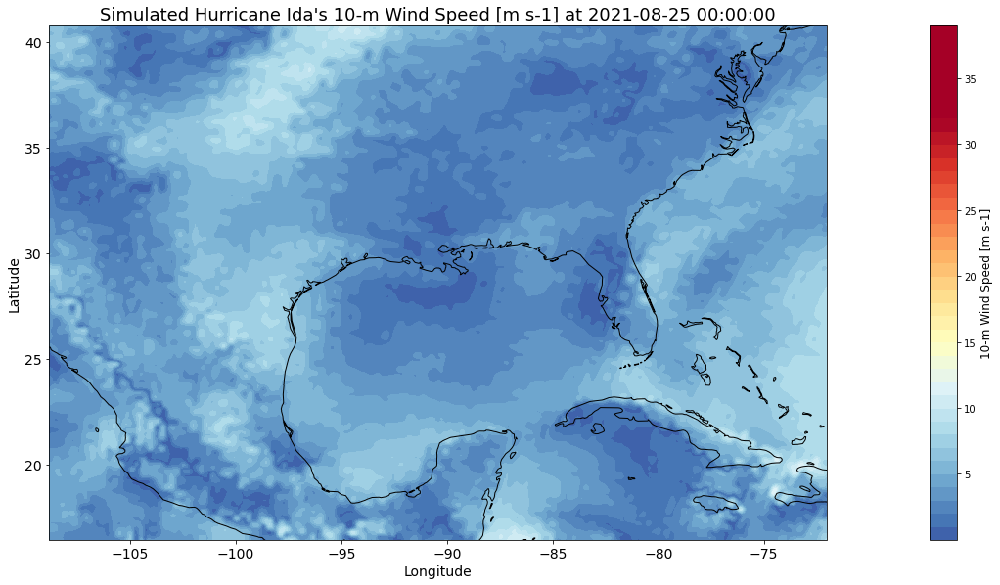

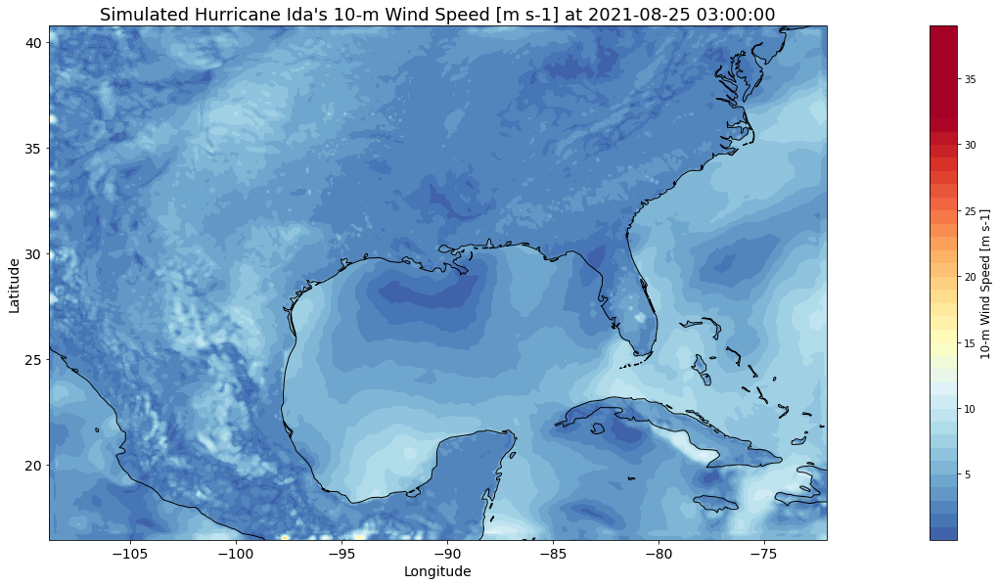

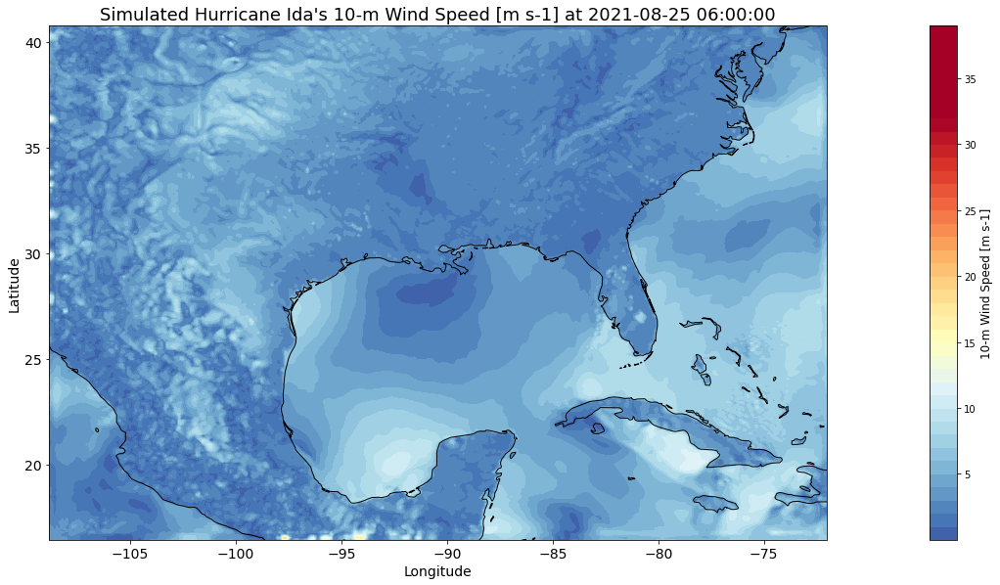

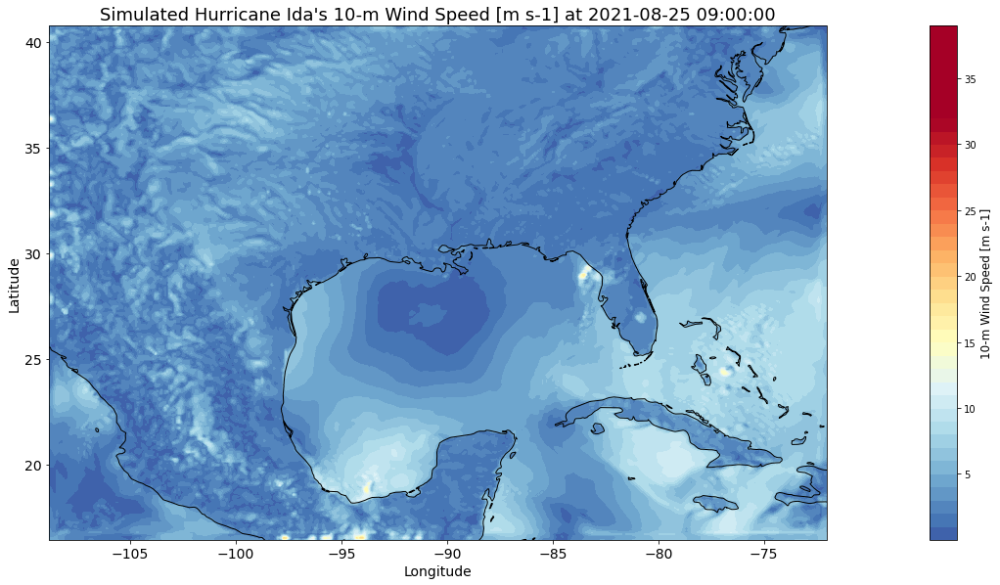

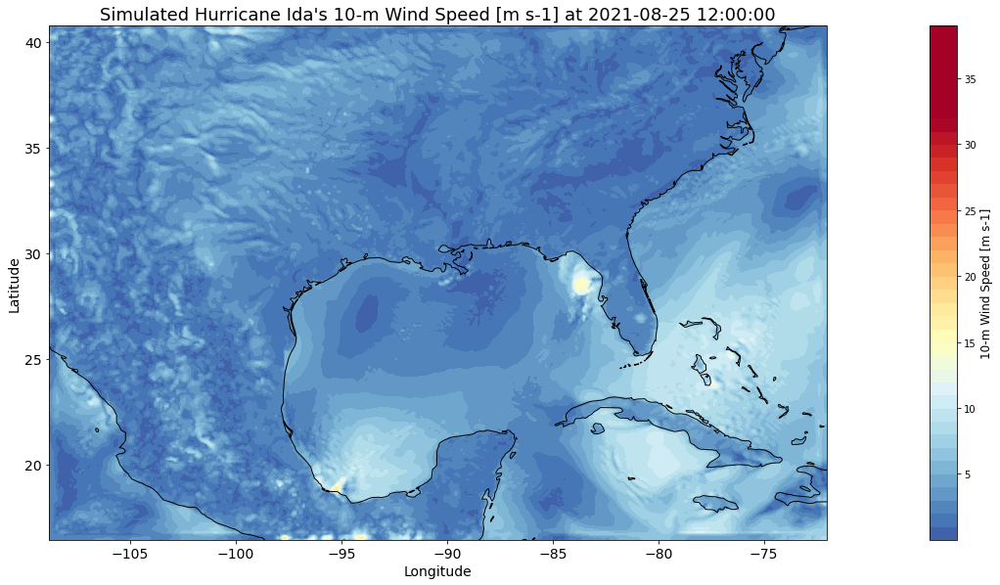

...

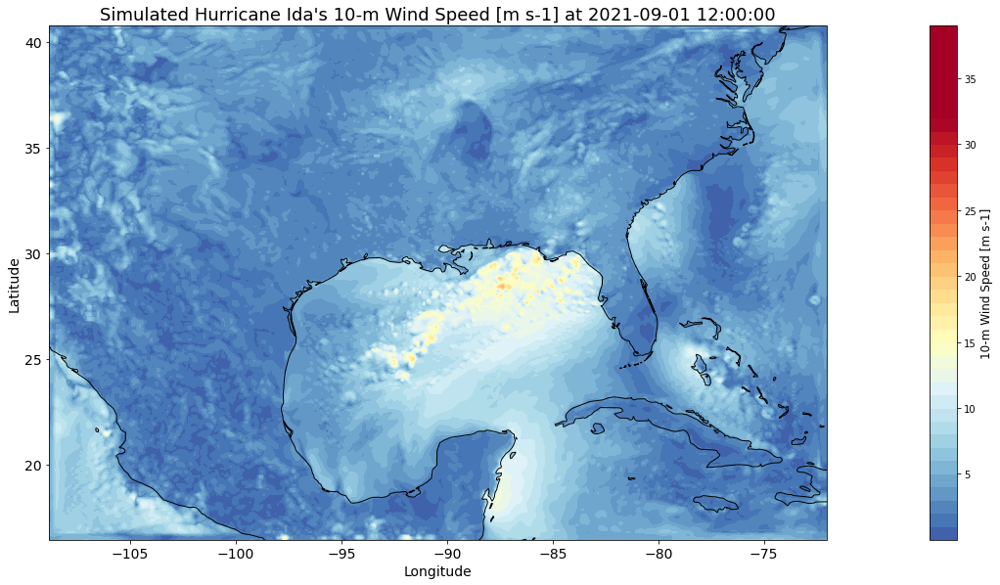

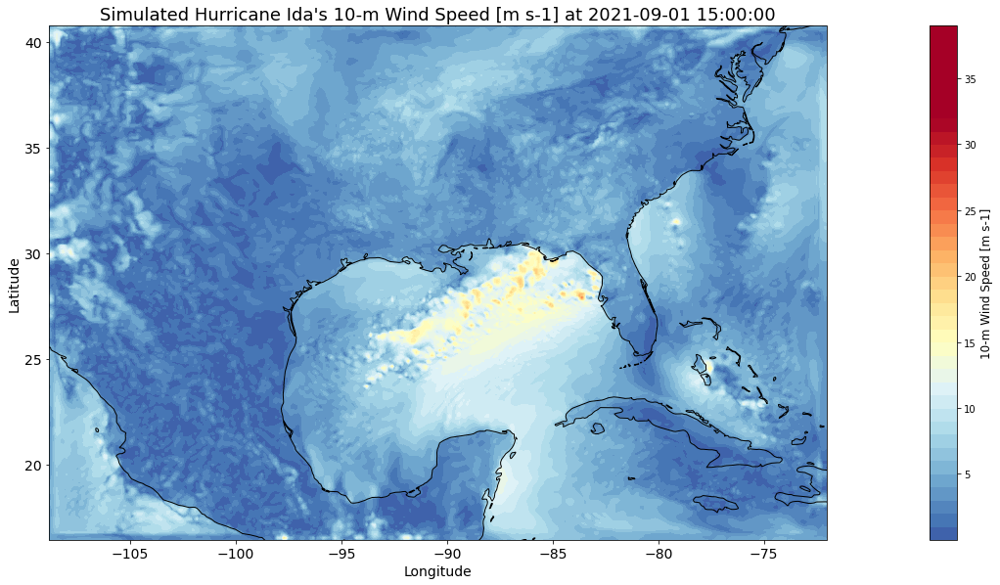

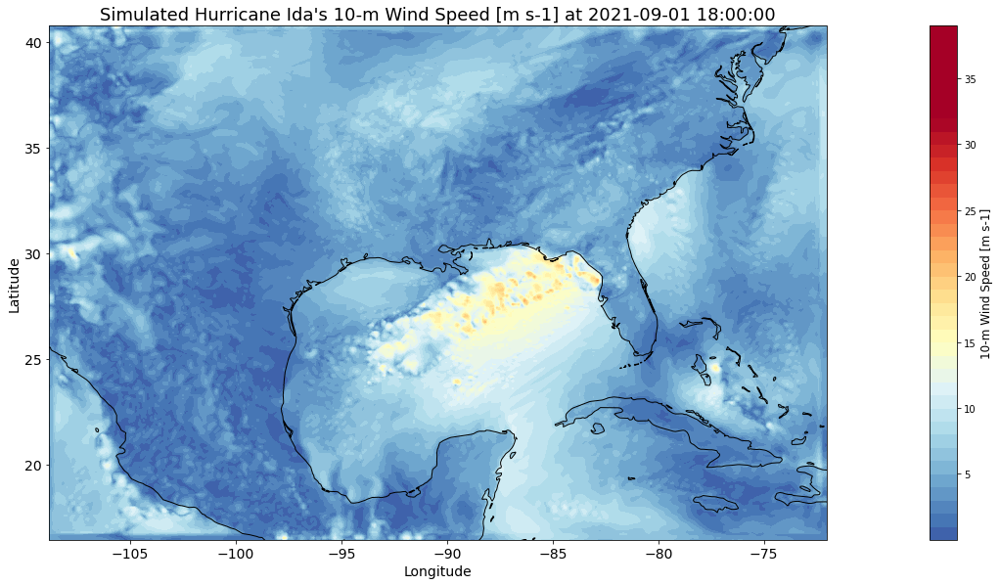

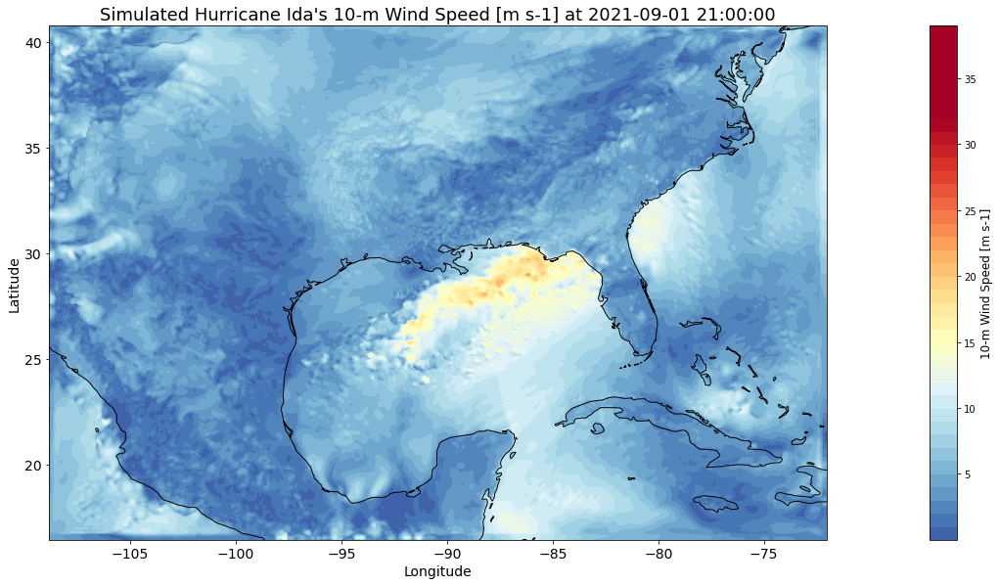

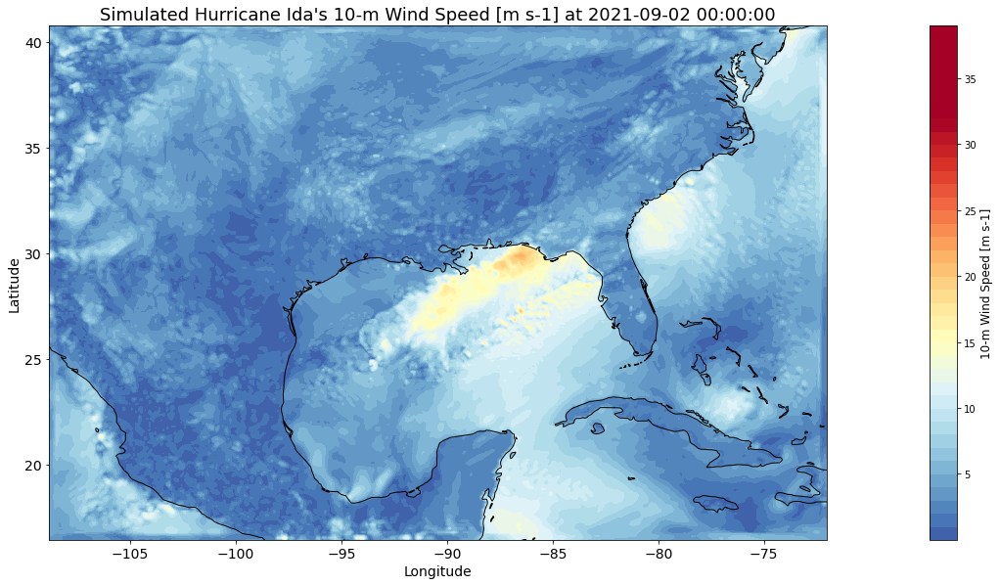

In [8]:
# Make a map of 10-m wind speed and loop through time for one simulation

## Extract min/max values to bound the size of the map
min_lat = ds_3['XLAT'].values.min()
max_lat = ds_3['XLAT'].values.max()
min_lon = ds_3['XLONG'].values.min()
max_lon = ds_3['XLONG'].values.max()
# MAP_BOUNDS = [-97.5, -90, 27.5, 32]
# MAP_BOUNDS = [-100, max_lon, 17.5, 35]

MAP_BOUNDS = [min_lon, max_lon, min_lat, max_lat-1.5]

for t in np.arange(0,np.size(times_3)):    
#     print(t)
    fig = plt.figure(figsize=(18,10))
    fig.patch.set_facecolor('white')
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent(MAP_BOUNDS)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.OCEAN)
    c_levels = np.arange(0, 40, 1)
    im = ax.contourf(ds_3['XLONG'].isel(Time=t),ds_3['XLAT'].isel(Time=t), 
           WS_10m_3.isel(Time=t), c_levels, cmap=plt.cm.RdYlBu_r)       

    title = "Simulated Hurricane Ida's 10-m Wind Speed [m s-1] at " + str(pd.to_datetime(ds_3['XTIME'].isel(Time=t).values)) 
    ax.set_title(title, fontsize=18)
    ax.xaxis.set_visible(True)    # Set xaxis visible because cartopy hides it by default
    ax.yaxis.set_visible(True)
    ax.tick_params(labelsize=14)
    ax.set_xlabel("Longitude", fontsize=14)
    ax.set_ylabel("Latitude", fontsize=14)

    # Adjust figure height so the xlabel isn't cut off when saved
    plt.gcf().subplots_adjust(bottom=0.15)
    fig.subplots_adjust(right=0.8)

    im.set_clim(-2, 32)  
    cbar_ax = fig.add_axes([0.85, 0.15, 0.022, 0.73])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.set_ticks([5,10,15,20,25,30,35])
    cbar.set_label("10-m Wind Speed [m s-1]", fontsize=12)
    
    plt.gcf().subplots_adjust(bottom=0.15)
    time_label = str(ds_3['XTIME'].isel(Time=t).values)[0:16]
    plt.savefig("10mWindSpeed_contour_"+time_label+".png")
    
os.system('convert -quality 92 -delay 0 -loop 0 10mWindSpeed_contour_*png 10mWindSpeed_contour.gif')

In [25]:
os.system('convert -quality 92 -delay 0 -loop 0 10mWindSpeed_contour_*png 10mWindSpeed_contour.gif')

9